In [1]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from models import basemodel, non_norm, ResnetLayer, Resnet, Resnet_regression
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
import seaborn as sns

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # 텐서플로가 첫 번째 GPU만 사용하도록 제한
  try:
    tf.config.set_visible_devices(gpus[0], 'GPU')
  except RuntimeError as e:
    # 프로그램 시작시에 접근 가능한 장치가 설정되어야만 합니다
    print(e)

2023-10-03 10:26:37.876640: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-03 10:26:37.996201: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-03 10:26:38.027709: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-03 10:26:38.547808: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
def train(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    learning_rate = 1e-3,
    cp_path = None,
    optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3),
    loss = tf.keras.losses.CategoricalCrossentropy(),
    metrics = ['accuracy', 'categorical_crossentropy']
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor='val_accuracy',
        mode='max',
        save_best_only = True,
        save_weigths_only = False,
    )
    # optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    # loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = metrics)
    print('X shape : ', X.shape)
    # model.build(input_shape = (1, X.shape[1]))          
    model.build(input_shape = (None, X.shape[1], 1))
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                callbacks = [callback]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.argmax(model.predict(test_X), axis = 1)
    y_gt = np.argmax(test_Y, axis = 1)
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('model accuracy ' + cp_path)
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['train', 'test'], loc='upper left')
    plt.savefig('./model_plot/accuracy_' + cp_path + '.png')

    # Y_pred_label = np.array([idx2label_Dict[y_pred[i]] for i in range(len(y_pred))])
    # Y_gt_label = np.array([idx2label_Dict[y_gt[i]] for i in range(len(y_gt))])
    # cm = confusion_matrix(Y_gt_label, Y_pred_label)
    # label = ['Asphalt', 'Brick', 'Tile', 'Sandbed', 'Urethane']
    # heatmap(cm, 'Road_surface_classification', label)
    return history

# def heatmap(matrix, title, label):
#     save_path = 'plot/cm.png'
#     df=pd.DataFrame(matrix, index = label, columns = label)
#     plt.figure(figsize=(10,10))
#     sns.heatmap(df, annot=True, fmt = 'd')
#     plt.tick_params(axis='x', top=True, labeltop = True,bottom=False, labelbottom=False)
#     plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns)
#     plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
#     plt.xlabel("Prediction",position = (0.5,1.0+0.05))
#     plt.ylabel("Ground Truth")
#     plt.title(title)
#     plt.savefig('cm.png', format='png', dpi=300)

In [3]:
def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

In [4]:
def file_sort(path):
    file_list = os.listdir(path)
    for file in file_list:
        if os.path.isfile(os.path.join(path, file)):
            createFolder('./'+path+'/' + file[:2])
            shutil.move('./'+path+'/' + file, './'+path+'/' + file[:2] + '/' + file)

In [5]:
def file_load(path):
    data = list()
    file_list = os.listdir(path)
    for file in file_list:
        file_path = os.path.join(path,file)
        if os.path.isfile(file_path):
            temp = np.load(file_path)
            data.append(temp)
    return data

In [6]:
folder_path = 'countingdatasmall'
# folder_path = 'counting'

In [7]:
file_sort(folder_path)

In [8]:
folder_list = os.listdir(folder_path)

In [9]:
folder_list = sorted(folder_list)

In [10]:
temp_path = os.path.join(folder_path,folder_list[1])
data = file_load(temp_path)

In [11]:
data_dict = dict()
for folder in folder_list:
    temp_path = os.path.join(folder_path,folder)
    data_dict[folder] = np.array(file_load(temp_path))

In [12]:
reshaped_data = dict()
for i in data_dict.keys():
    reshaped_data[i] = data_dict[i].reshape(data_dict[i].shape[0]*data_dict[i].shape[1], data_dict[i].shape[2], data_dict[i].shape[3])
    reshaped_data[i] = reshaped_data[i].reshape(reshaped_data[i].shape[0], reshaped_data[i].shape[2])

In [13]:
reshaped_data['00'].shape

(240, 301)

In [14]:
range_fft_dict= dict()
for i in reshaped_data.keys():
    range_fft_dict[i] = np.fft.fftshift(np.fft.fft(reshaped_data[i], axis=1), axes=1)

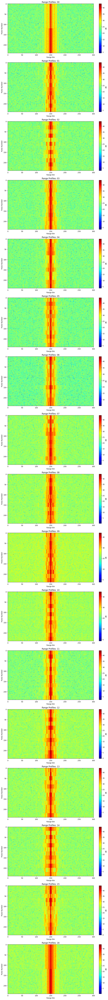

In [15]:
# 서브플롯 그리기
num_profiles = len(range_fft_dict)
plt.figure(figsize=(10, 5 * num_profiles))

for idx, (key, profile) in enumerate(range_fft_dict.items(), 1):
    plt.subplot(num_profiles, 1, idx)
    plt.imshow(10 * np.log10(np.abs(profile)), aspect='auto', cmap='jet', interpolation='none')
    # plt.imshow(np.abs(profile), aspect='auto', cmap='jet', interpolation='none')
    plt.colorbar(label="dB")
    plt.xlabel("Range Bin")
    plt.ylabel("Pulse Number")
    plt.title(f"Range Profiles: {key}")

plt.tight_layout()
plt.show()

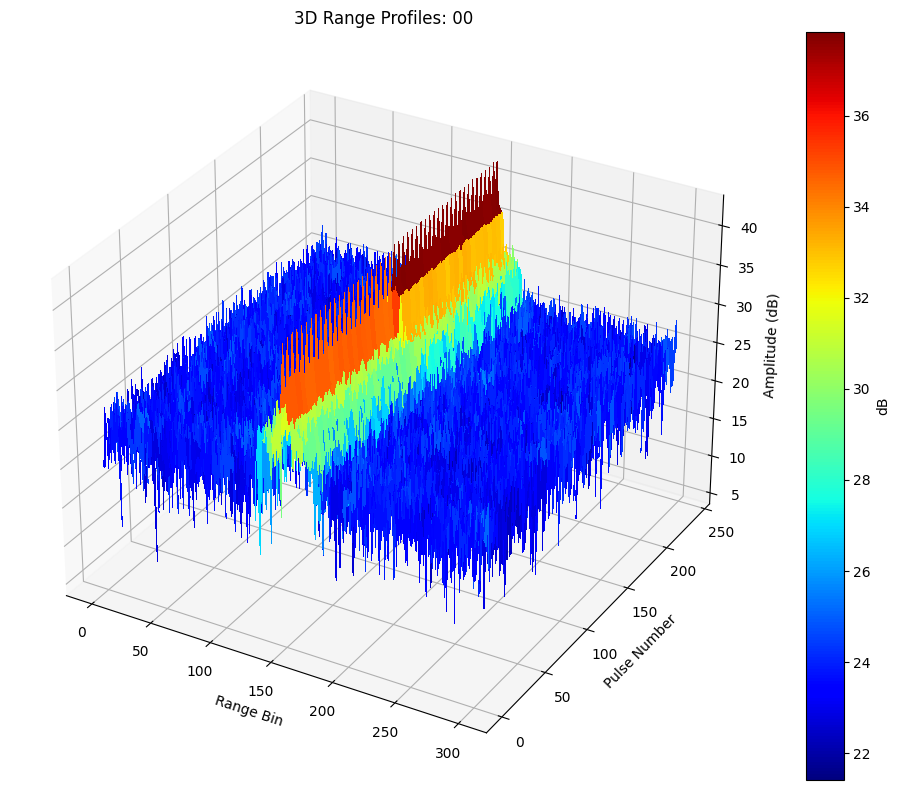

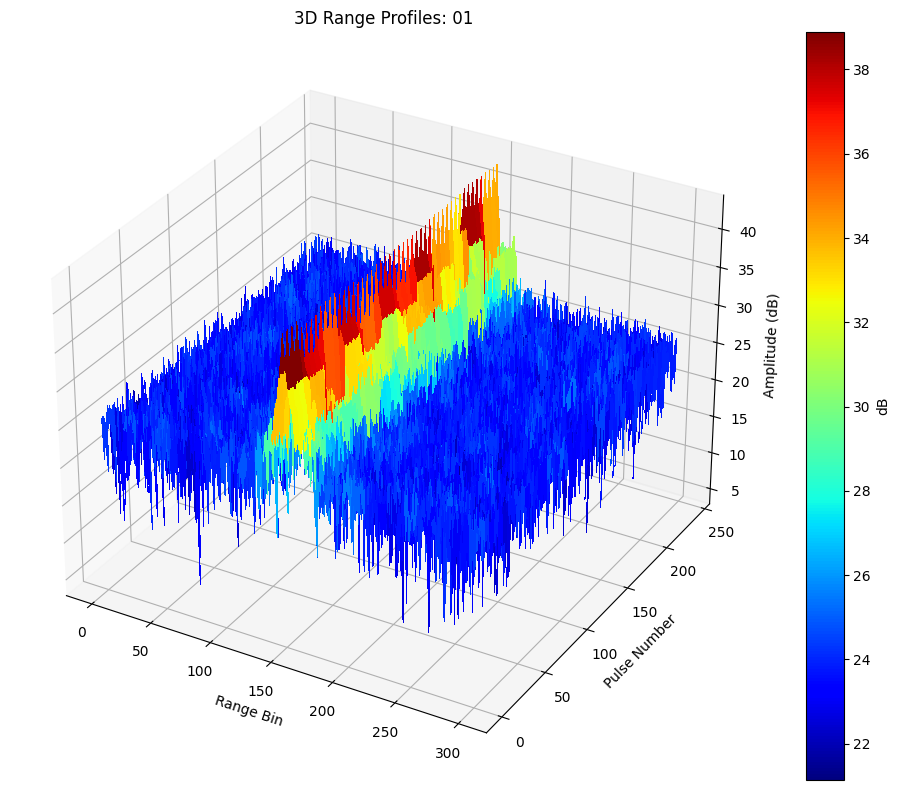

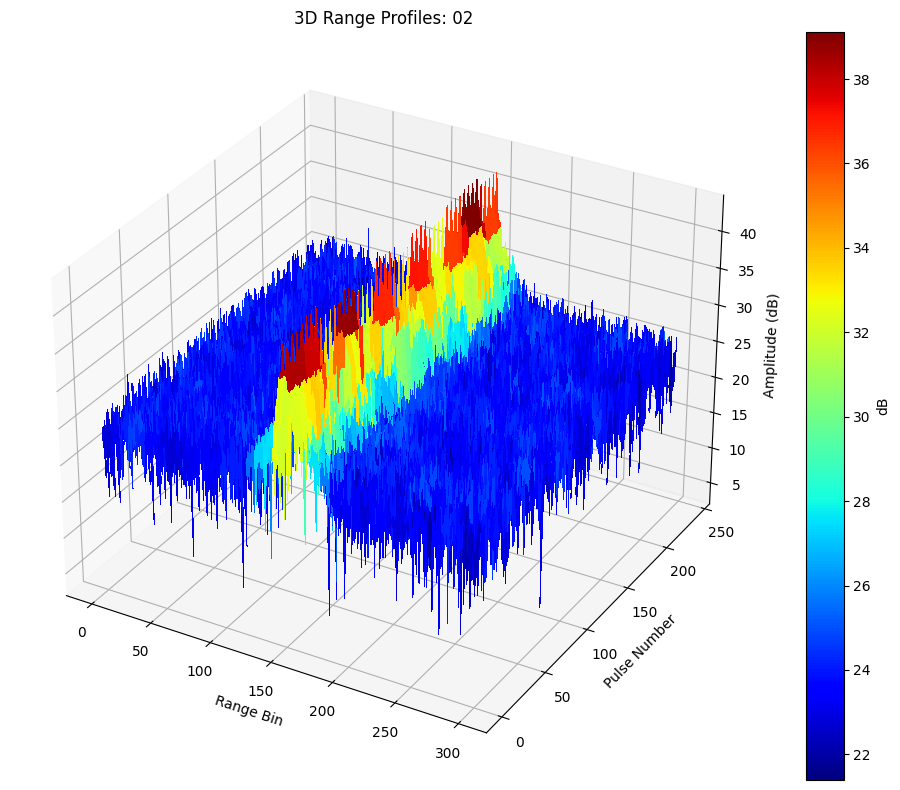

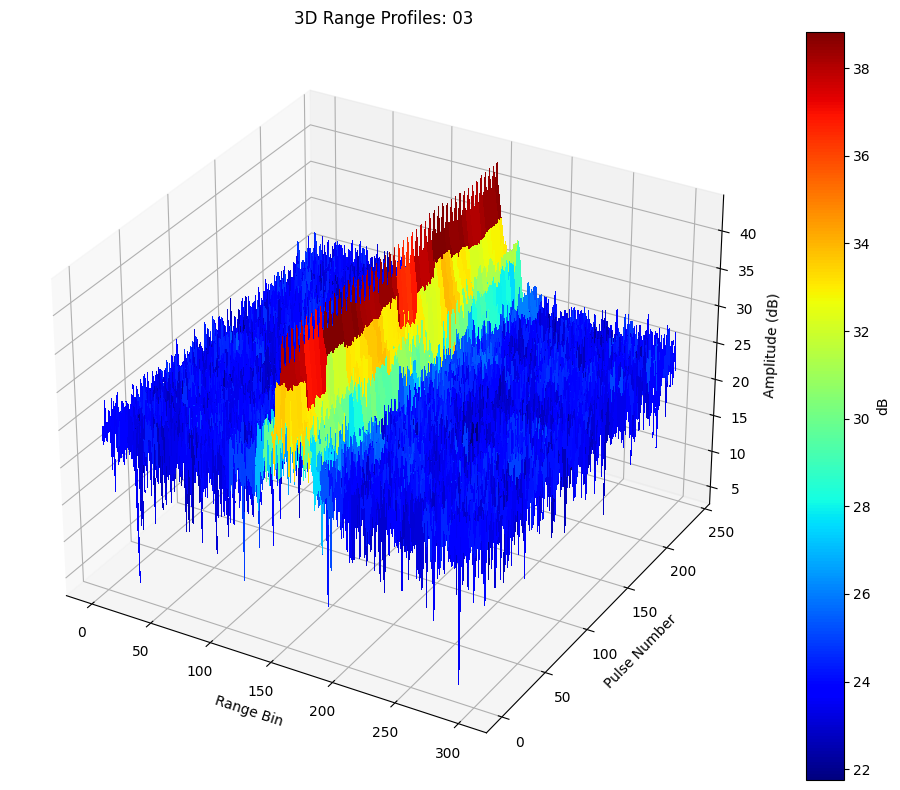

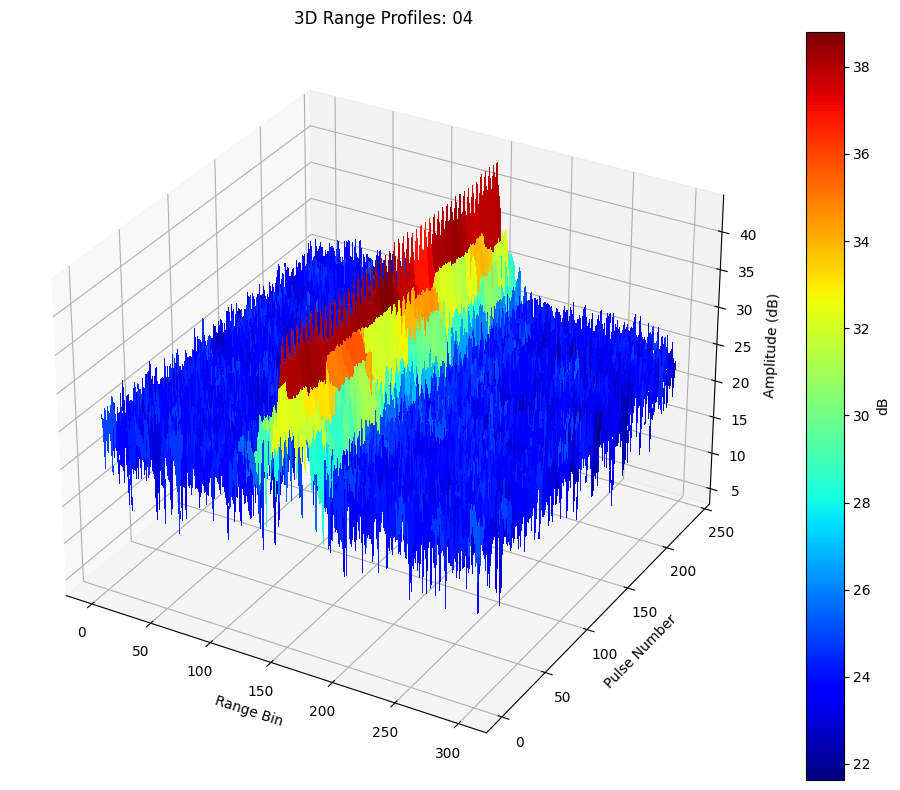

...

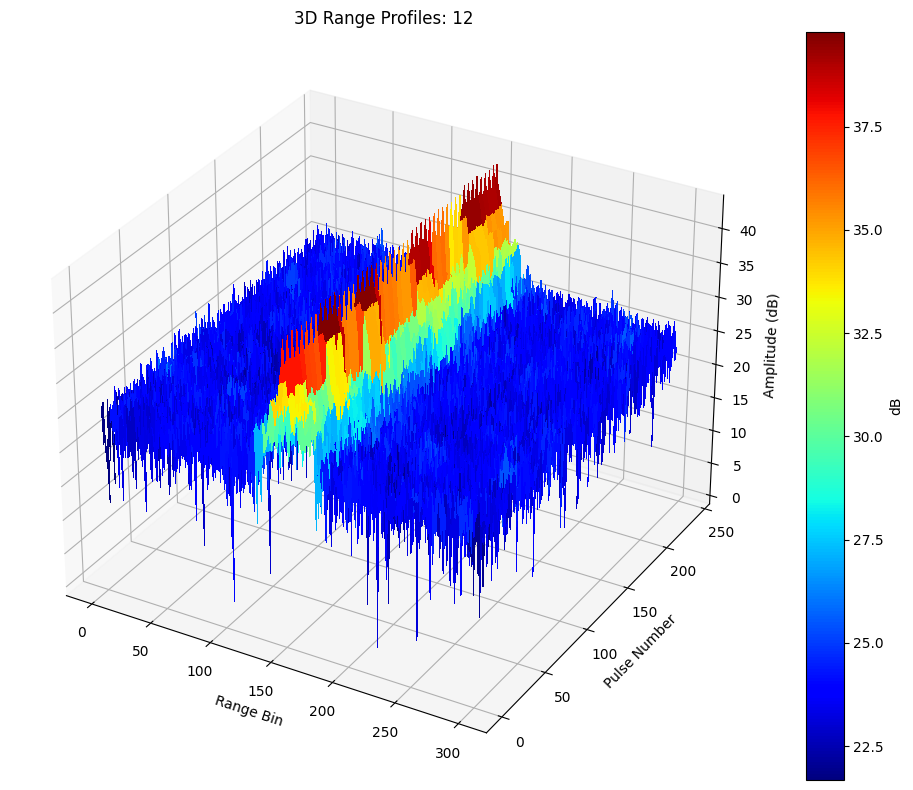

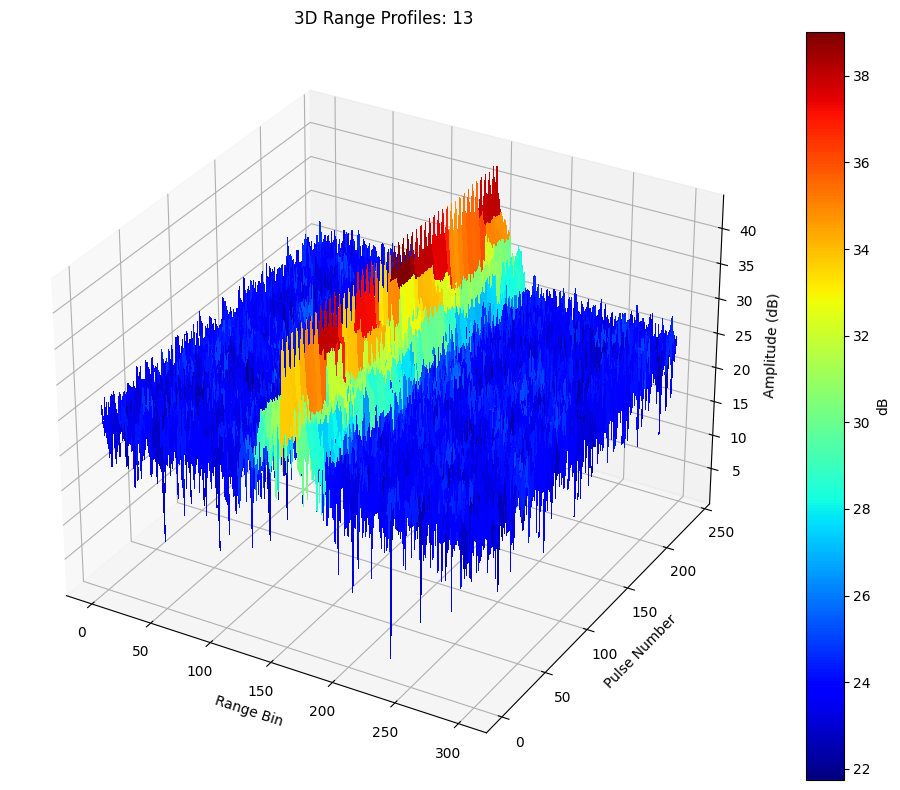

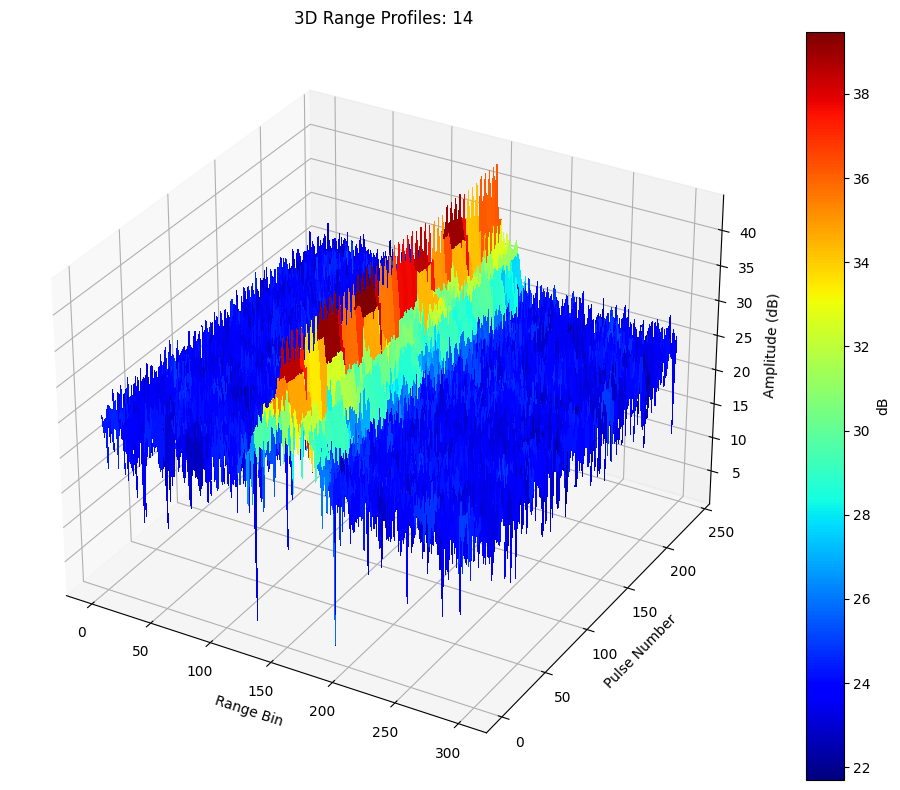

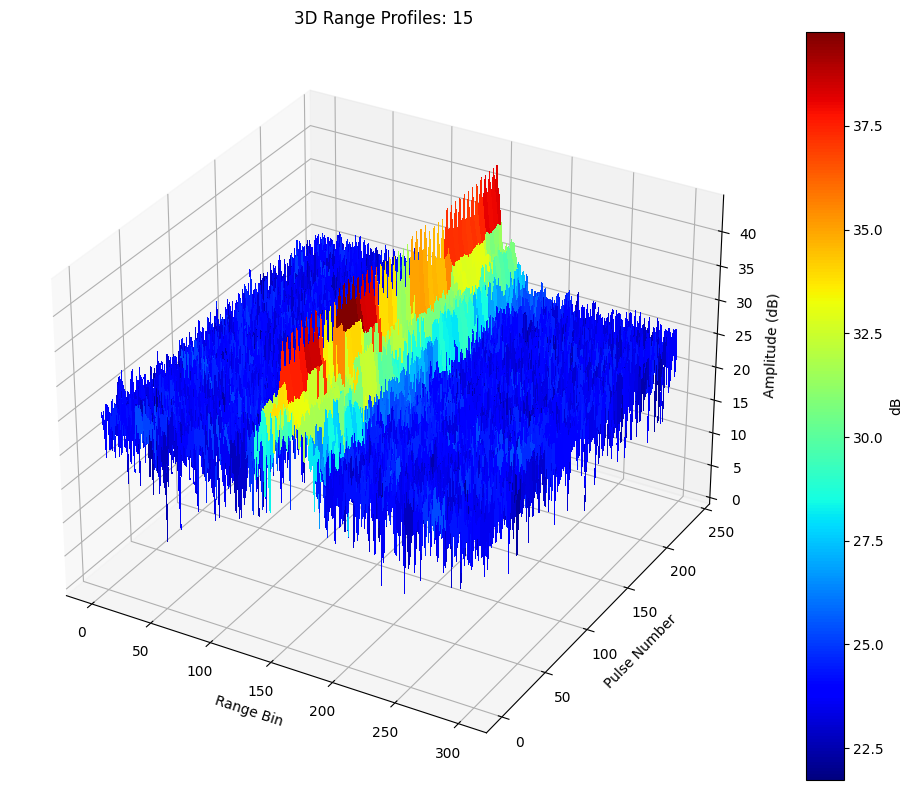

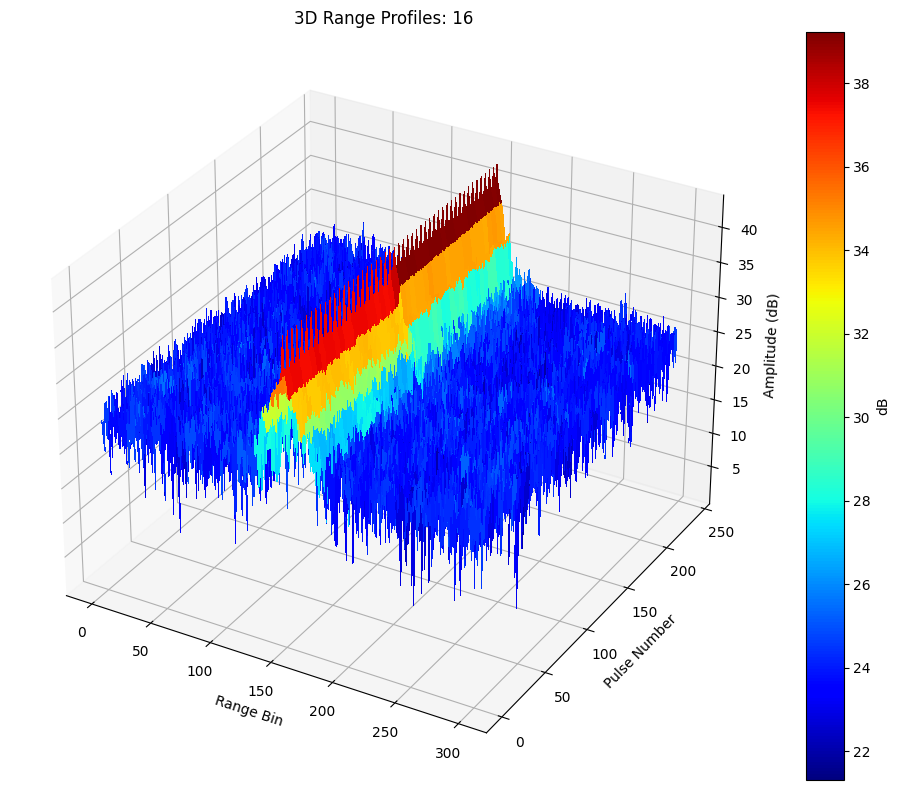

In [16]:
# 그래프 그리기
num_profiles = len(range_fft_dict)

for idx, (key, profile) in enumerate(range_fft_dict.items(), 1):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    X = np.arange(profile.shape[1])  # Range Bin
    Y = np.arange(profile.shape[0])  # Pulse Number
    X, Y = np.meshgrid(X, Y)
    Z = 10 * np.log10(np.abs(profile))
    
    surf = ax.plot_surface(X, Y, Z, cmap='jet', linewidth=0, antialiased=False)
    
    ax.set_xlabel("Range Bin")
    ax.set_ylabel("Pulse Number")
    ax.set_zlabel("Amplitude (dB)")
    ax.set_title(f"3D Range Profiles: {key}")
    fig.colorbar(surf, ax=ax, label="dB")

    plt.tight_layout()
    plt.show()

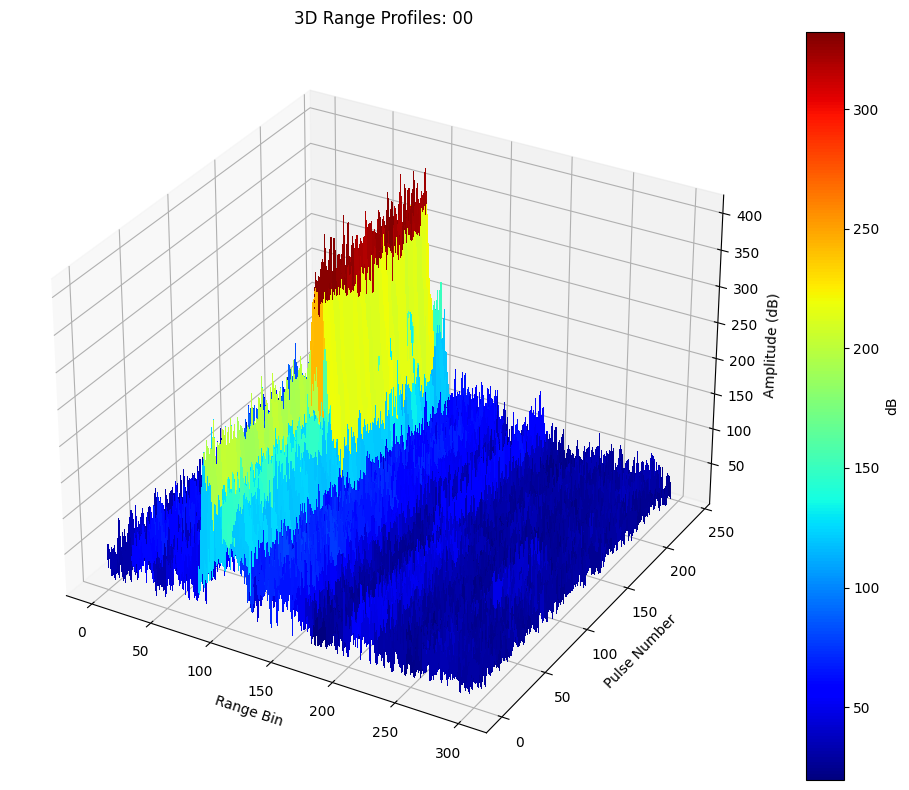

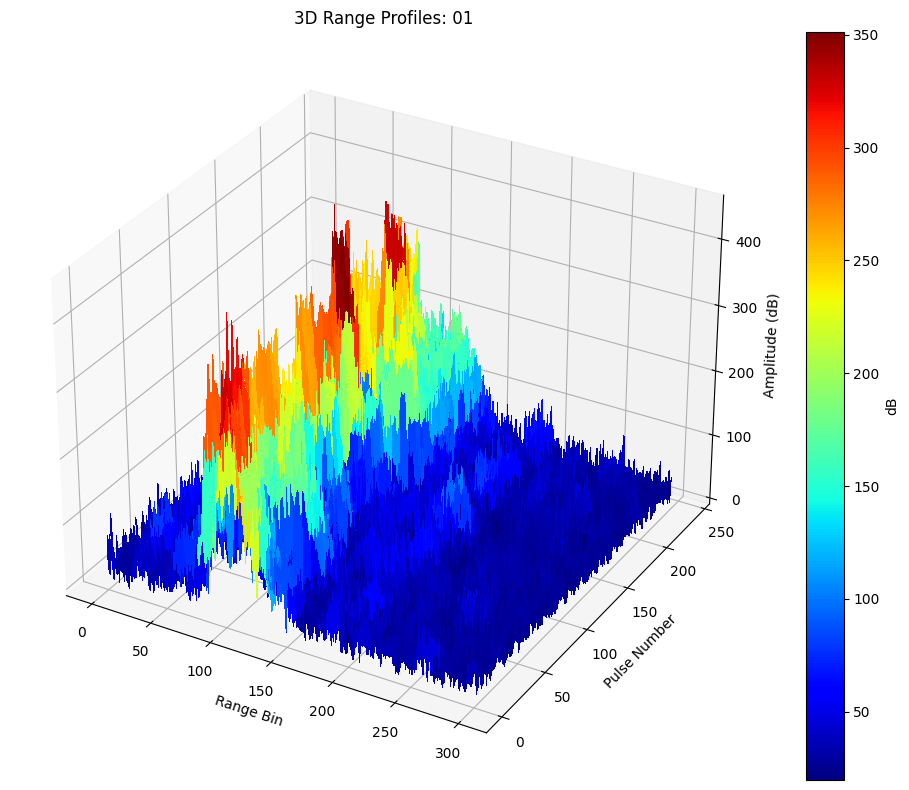

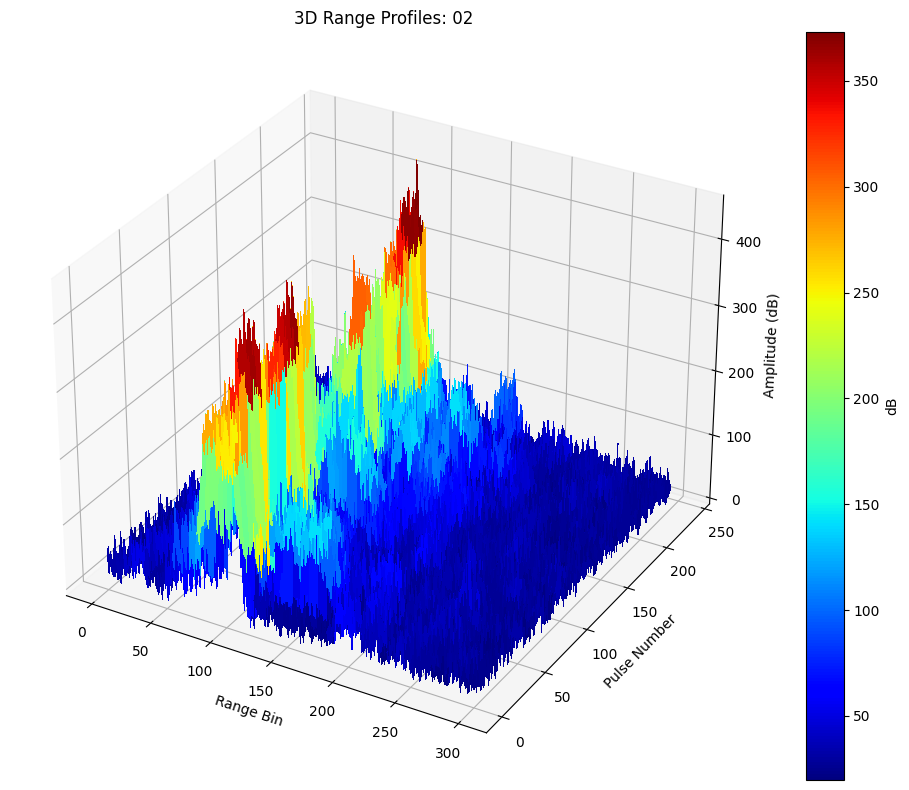

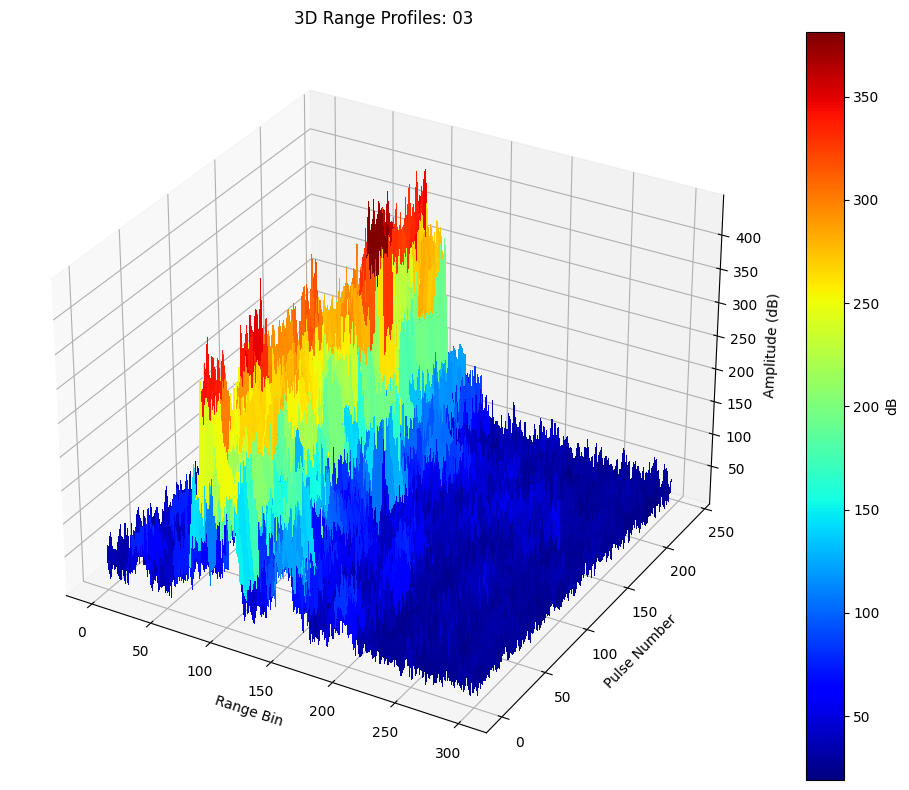

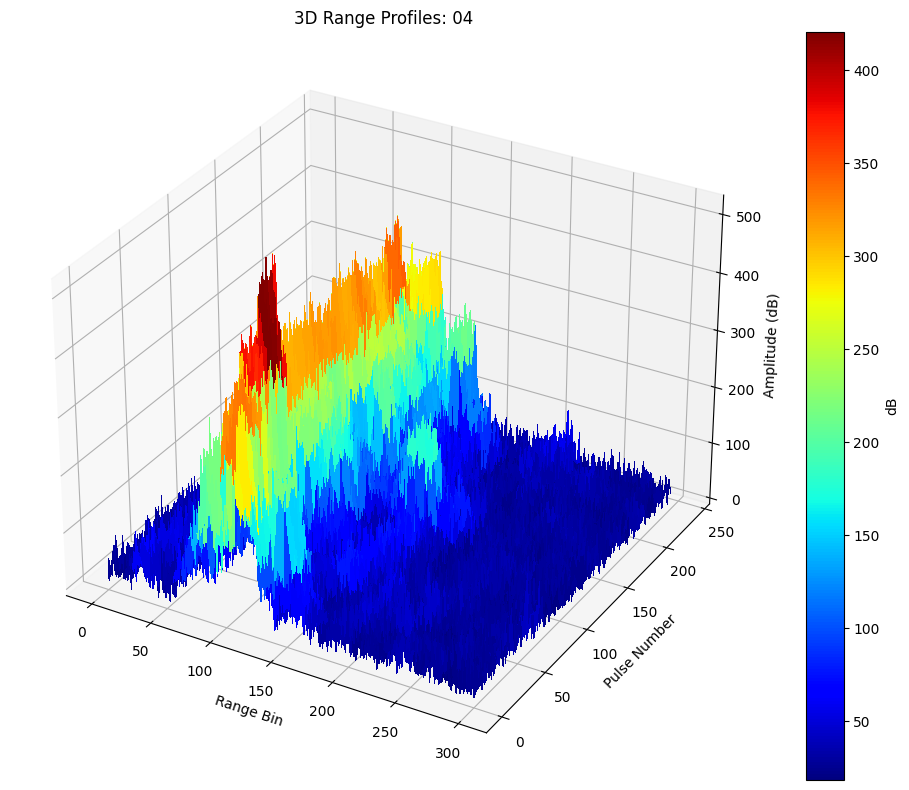

...

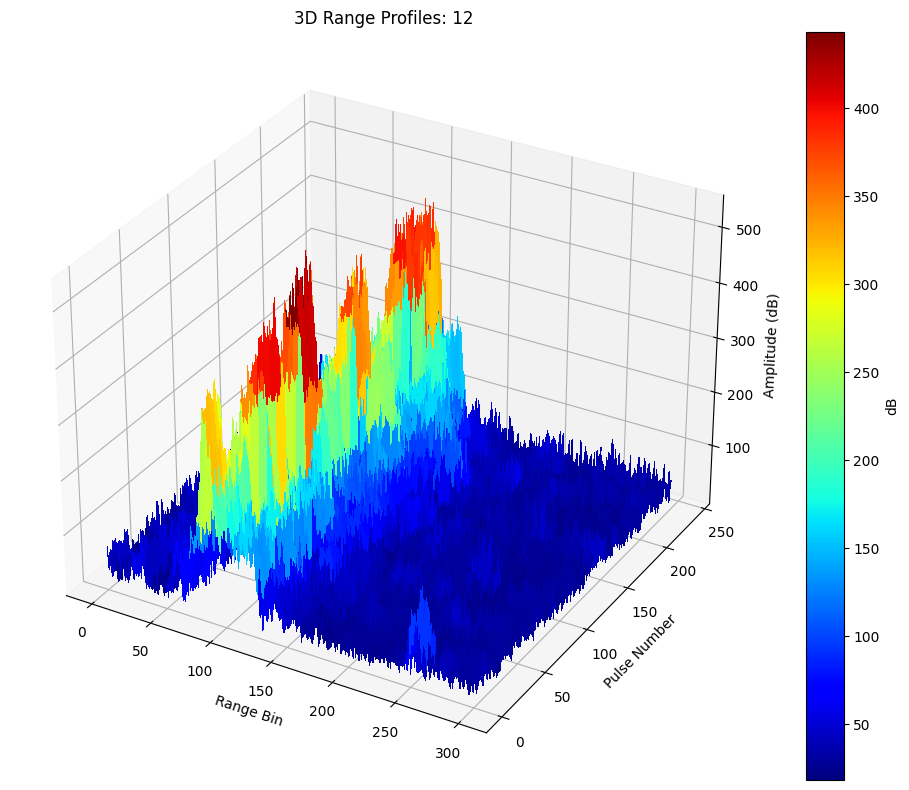

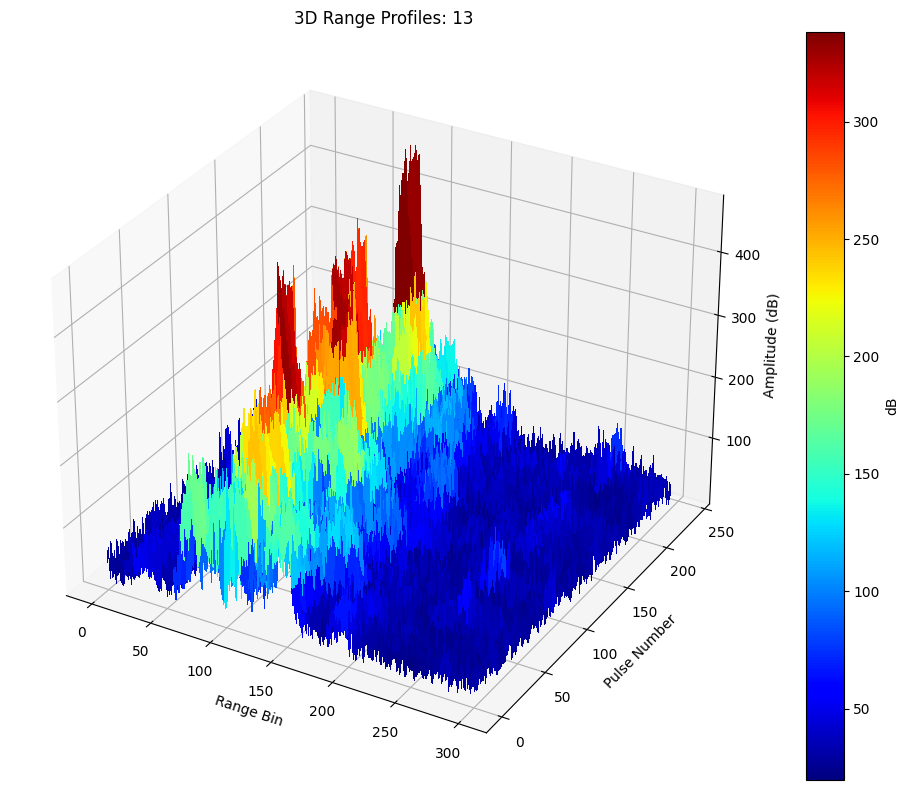

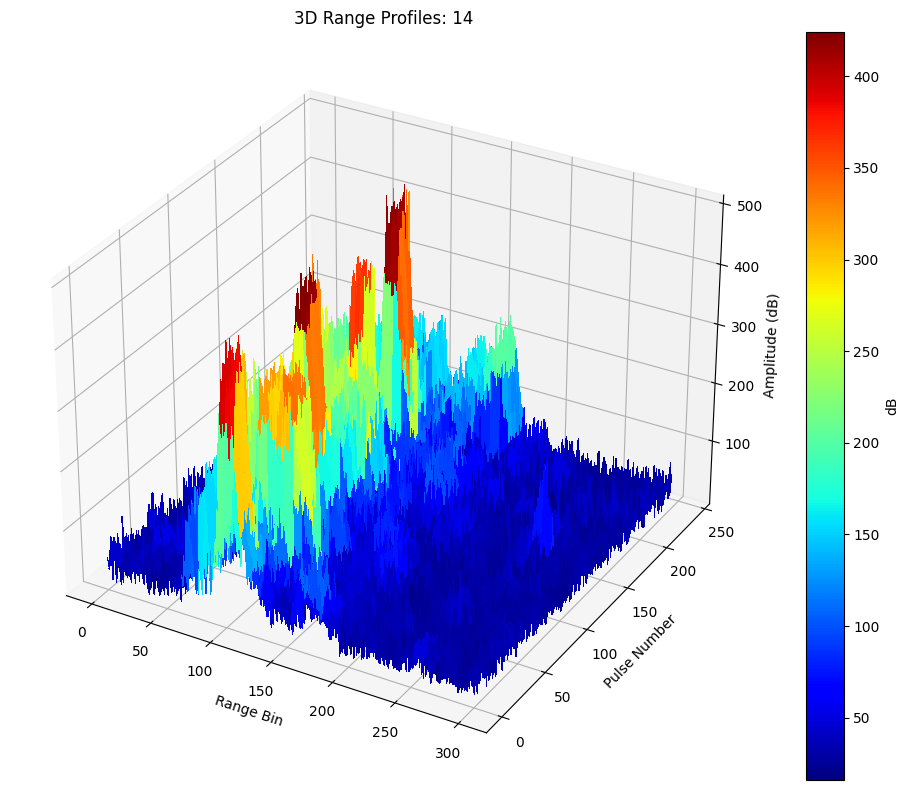

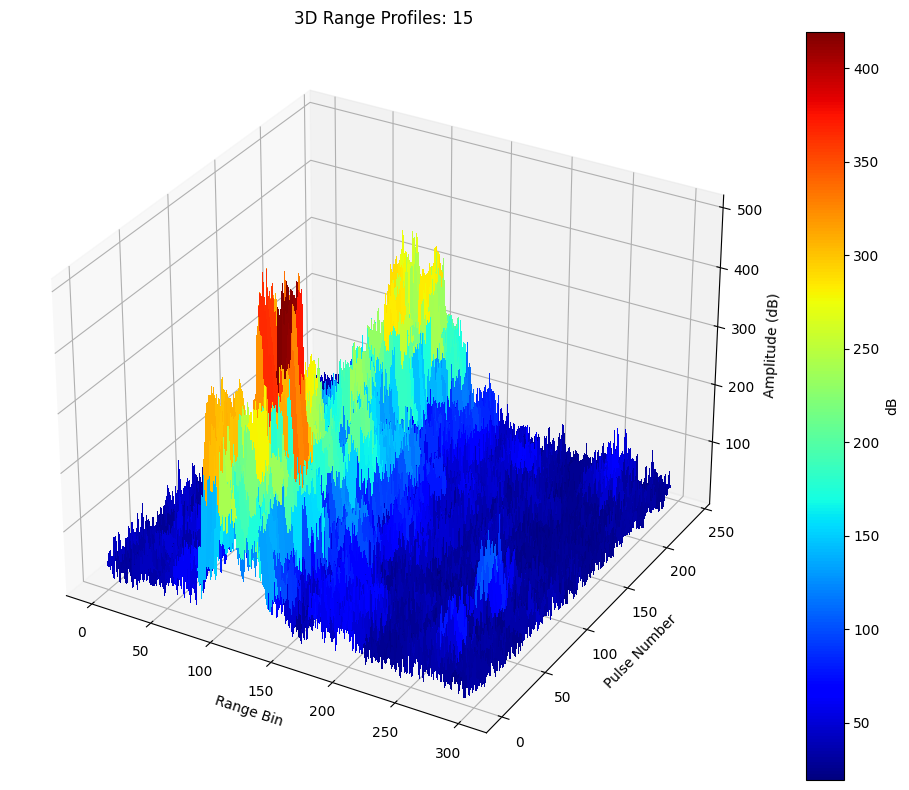

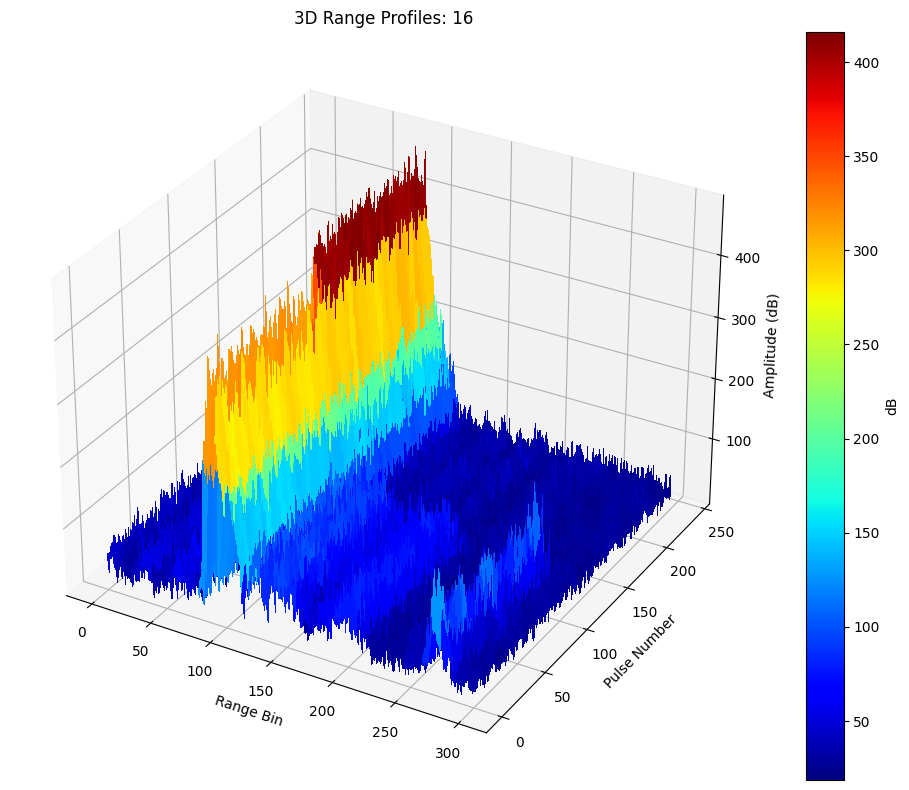

In [17]:
num_profiles = len(reshaped_data)

for idx, (key, profile) in enumerate(reshaped_data.items(), 1):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    X = np.arange(profile.shape[1])  # Range Bin
    Y = np.arange(profile.shape[0])  # Pulse Number
    X, Y = np.meshgrid(X, Y)
    # Z = 10 * np.log10(np.abs(profile))
    Z = np.abs(profile)
    
    surf = ax.plot_surface(X, Y, Z, cmap='jet', linewidth=0, antialiased=False)
    
    ax.set_xlabel("Range Bin")
    ax.set_ylabel("Pulse Number")
    ax.set_zlabel("Amplitude (dB)")
    ax.set_title(f"3D Range Profiles: {key}")
    fig.colorbar(surf, ax=ax, label="dB")

    plt.tight_layout()
    plt.show()

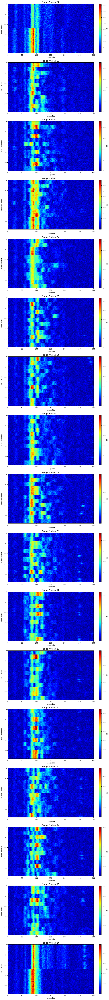

In [18]:
# 서브플롯 그리기
num_profiles = len(reshaped_data)
plt.figure(figsize=(10, 5 * num_profiles))

for idx, (key, profile) in enumerate(reshaped_data.items(), 1):
    plt.subplot(num_profiles, 1, idx)
    plt.imshow(profile, aspect='auto', cmap='jet', interpolation='none')
    # plt.imshow(np.abs(profile), aspect='auto', cmap='jet', interpolation='none')
    plt.colorbar(label="dB")
    plt.xlabel("Range Bin")
    plt.ylabel("Pulse Number")
    plt.title(f"Range Profiles: {key}")

plt.tight_layout()
plt.show()

In [19]:
# model = basemodel(len(range_fft_dict))

In [20]:
def make_dataset(data_dict):
    x = list()
    y = list()
    for key, data in data_dict.items():
        x.append(data)
        for i in range(data.shape[0]):
            y.append(to_categorical(int(key), num_classes=len(data_dict)))
    x = np.array(x)
    x = x.reshape(x.shape[0]*x.shape[1], x.shape[2])
    y = np.array(y)
    X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [21]:
# X_train, X_test, Y_train, Y_test = make_dataset(range_fft_dict)
# X_train, X_test  = 10 * np.log10(X_train), 10 * np.log10(X_test)
X_train, X_test, Y_train, Y_test = make_dataset(reshaped_data)


In [24]:
# non_norm_model = non_norm(len(range_fft_dict))

# base model
# model = basemodel(len(range_fft_dict))

# Resnet
filter_in_list = [1, 32]
filter_out_list = [32, 64]
kernel_size = 3
X_train, X_test = np.expand_dims(X_train, axis = 2), np.expand_dims(X_test, axis = 2)
model = Resnet(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=len(range_fft_dict))
history = train(model = model, X = X_train, Y = Y_train, test_X = X_test, test_Y = Y_test, cp_path = 'resnet_range_fft', Epoch=500)

X shape :  (3264, 301, 1, 1, 1)
Model: "resnet_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_2 (Normalizat  multiple                 3         
 ion)                                                            
                                                                 
 resnet_layer_2 (ResnetLayer  multiple                 24484     
 )                                                               
                                                                 
 flatten_2 (Flatten)         multiple                  0         
                                                                 
 dense_8 (Dense)             multiple                  2465920   
                                                                 
 dense_9 (Dense)             multiple                  8256      
                                                                 
 dense_10 (Dense)         

ValueError: in user code:

    File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/engine/training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/engine/training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/engine/training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/engine/training.py", line 993, in train_step
        y_pred = self(x, training=True)
    File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/tmp/__autograph_generated_fileg47y3taa.py", line 11, in tf__call
        x = ag__.converted_call(ag__.ld(self).resnet_layer, (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)
    File "/tmp/__autograph_generated_file8_xnvr4e.py", line 23, in tf__call
        ag__.for_stmt(ag__.ld(self).sequence, None, loop_body, get_state, set_state, ('x',), {'iterate_names': 'unit'})
    File "/tmp/__autograph_generated_file8_xnvr4e.py", line 21, in loop_body
        x = ag__.converted_call(ag__.ld(unit), (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)
    File "/tmp/__autograph_generated_file5l1doi_p.py", line 10, in tf__call
        h = ag__.converted_call(ag__.ld(self).bn1, (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)

    ValueError: Exception encountered when calling layer "resnet_2" "                 f"(type Resnet).
    
    in user code:
    
        File "/data_disk/home/joongho/radar_verity/models.py", line 119, in call  *
            x = self.resnet_layer(x, training=training)
        File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler  **
            raise e.with_traceback(filtered_tb) from None
        File "/tmp/__autograph_generated_file8_xnvr4e.py", line 23, in tf__call
            ag__.for_stmt(ag__.ld(self).sequence, None, loop_body, get_state, set_state, ('x',), {'iterate_names': 'unit'})
        File "/tmp/__autograph_generated_file8_xnvr4e.py", line 21, in loop_body
            x = ag__.converted_call(ag__.ld(unit), (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)
        File "/tmp/__autograph_generated_file5l1doi_p.py", line 10, in tf__call
            h = ag__.converted_call(ag__.ld(self).bn1, (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)
    
        ValueError: Exception encountered when calling layer "resnet_layer_2" "                 f"(type ResnetLayer).
        
        in user code:
        
            File "/data_disk/home/joongho/radar_verity/models.py", line 103, in call  *
                x = unit(x, training=training)
            File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler  **
                raise e.with_traceback(filtered_tb) from None
            File "/tmp/__autograph_generated_file5l1doi_p.py", line 10, in tf__call
                h = ag__.converted_call(ag__.ld(self).bn1, (ag__.ld(x),), dict(training=ag__.ld(training)), fscope)
        
            ValueError: Exception encountered when calling layer "residual_unit_4" "                 f"(type ResidualUnit).
            
            in user code:
            
                File "/data_disk/home/joongho/radar_verity/models.py", line 84, in call  *
                    h = self.bn1(x, training=training)
                File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler  **
                    raise e.with_traceback(filtered_tb) from None
                File "/data_disk/home/joongho/.conda/envs/121/lib/python3.8/site-packages/keras/engine/input_spec.py", line 232, in assert_input_compatibility
                    raise ValueError(
            
                ValueError: Input 0 of layer "batch_normalization_8" is incompatible with the layer: expected ndim=3, found ndim=5. Full shape received: (32, 301, 1, 1, 1)
            
            
            Call arguments received by layer "residual_unit_4" "                 f"(type ResidualUnit):
              • x=tf.Tensor(shape=(32, 301, 1, 1, 1), dtype=float32)
              • training=True
              • mask=None
        
        
        Call arguments received by layer "resnet_layer_2" "                 f"(type ResnetLayer):
          • x=tf.Tensor(shape=(32, 301, 1, 1, 1), dtype=float32)
          • training=True
          • mask=None
    
    
    Call arguments received by layer "resnet_2" "                 f"(type Resnet):
      • x=tf.Tensor(shape=(32, 301, 1, 1, 1), dtype=float32)
      • training=True
      • mask=None


In [ ]:
loss = tf.keras.losses.MeanSquaredError()
metrics = ['mae', 'mse']
model = Resnet_regression(filter_in = filter_in_list, filters = filter_out_list, kernel_size = kernel_size, out_nums=len(range_fft_dict))
Y_train, Y_test = np.argmax(Y_train, axis = 1), np.argmax(Y_test, axis = 1)
history = train(model = model, X = X_train, Y = Y_train, test_X = X_test, test_Y = Y_test, cp_path = 'resnet_range_fft_regression', Epoch=500, loss = loss, metrics = metrics)

TypeError: super(type, obj): obj must be an instance or subtype of type